In [78]:
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt

In [79]:
pd.options.display.max_colwidth = 500

In [80]:
f = pd.read_csv('202005171549_corona_tweets.csv')
df = pd.DataFrame(data = f)
df.head(3)

,Unnamed: 0,Unnamed: 0.1,coordinates,country,created_at,device,entity_hashtags,entity_mentions,entity_type,entity_urls,id_str,in_reply_to_user_id,is_retweet,screen_name,text,tweet_location,user_followers,user_following,user_id,user_location
0,34646,34646,NaN,NaN,2020-03-03 02:49:50,Twitter for iPhone,[],[],NaN,['twitter.com/i/web/status/1…'],1234672302903590913,NaN,False,Manny_Alicandro,"Every 3 days? Coronavirus in NY? Workers will disinfect parts of subways, buses every 72 hours as New York reports… https://t.co/sxVkmdTeME",NaN,9125,4872,992623688028774400,NY
1,34647,34647,NaN,NaN,2020-03-03 02:49:50,Twitter for Android,[],['shobey_edits'],NaN,[],1234672302647738370,NaN,True,wodzd,"RT @shobey_edits: sent a mail to marvel ent, regarding dogyul and dongpyo's fm asking about any update in-line with covid-19 and finally go…",NaN,3123,3103,1086492406466277377,𝐗𝐎𝐧𝐞𝐈𝐭
2,34648,34648,NaN,NaN,2020-03-03 02:49:50,Twitter for iPhone,[],['realDonaldTrump'],NaN,['twitter.com/i/web/status/1…'],1234672301888532480,25073877.0,False,mom2speak1,"@realDonaldTrump Wow, a nice incubator for COVID-19! But hey, what do epidemiologists know, right Donny? Make Ameri… https://t.co/FCk8mUHmKe",NaN,313,1149,800391394191810560,United States


In [81]:
f2 = pd.read_csv('202005171549_corona_tweets.csv', nrows=15)
print(f2)

    Unnamed: 0  Unnamed: 0.1  coordinates  country           created_at  \
0        34646         34646          NaN      NaN  2020-03-03 02:49:50   
1        34647         34647          NaN      NaN  2020-03-03 02:49:50   
2        34648         34648          NaN      NaN  2020-03-03 02:49:50   
3        34649         34649          NaN      NaN  2020-03-03 02:49:50   
4        34650         34650          NaN      NaN  2020-03-03 02:49:50   
5        34651         34651          NaN      NaN  2020-03-03 02:49:49   
6        34652         34652          NaN      NaN  2020-03-03 02:49:49   
7        34653         34653          NaN      NaN  2020-03-03 02:49:49   
8        34654         34654          NaN      NaN  2020-03-03 02:49:49   
9        34655         34655          NaN      NaN  2020-03-03 02:49:48   
10       34656         34656          NaN      NaN  2020-03-03 02:49:48   
11       34657         34657          NaN      NaN  2020-03-03 02:49:47   
12       34658         34

In [82]:
#1- How many lines are there in the dataframe? How much space does it consume in your memory? 

In [83]:
len(df)

541793

In [84]:
df.memory_usage()
df.memory_usage(index=True).sum() #Overall memory consumption
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541793 entries, 0 to 541792
Data columns (total 20 columns):
Unnamed: 0             541793 non-null int64
Unnamed: 0.1           541793 non-null int64
coordinates            74 non-null object
country                1900 non-null object
created_at             541793 non-null object
device                 541793 non-null object
entity_hashtags        541793 non-null object
entity_mentions        541793 non-null object
entity_type            20792 non-null object
entity_urls            541793 non-null object
id_str                 541793 non-null int64
in_reply_to_user_id    24382 non-null float64
is_retweet             541793 non-null bool
screen_name            541793 non-null object
text                   541793 non-null object
tweet_location         1902 non-null object
user_followers         541793 non-null int64
user_following         541793 non-null int64
user_id                541793 non-null int64
user_location          367568 no

In [85]:
#2- What are the column names?

In [86]:
for col in df.columns: 
    print(col) 

Unnamed: 0
Unnamed: 0.1
coordinates
country
created_at
device
entity_hashtags
entity_mentions
entity_type
entity_urls
id_str
in_reply_to_user_id
is_retweet
screen_name
text
tweet_location
user_followers
user_following
user_id
user_location


In [87]:
#3- Identify the most tweeting 50 users.

In [88]:
most_tweeting_users = df['screen_name'].value_counts() 
print(most_tweeting_users.head(50))

FluTrackers        312
s_akrati           309
the_paper_link     275
LarryBoorstein     265
BearingTruth       242
ORoomLeb           179
DoobiestB          145
GertvanderHoek     140
ungubunugu1274     133
viriyabot          130
TomthunkitsMind    128
CellosSuits        114
COVID19USA         111
FredWilliams77     111
gaiapunk           104
Tanis42             96
JmeDubya            96
VIKBataille         92
benhaygood          91
ErnstNordholt       91
Bitte__B            85
Jerri47             85
EcoInternetDrGB     82
sheltgarner         81
BaronianConsult     79
SylviaZ1913         78
RonanKelly13        76
realJohnCurley      76
florian_krammer     75
JaneSepmeier        73
kr3at               71
species_x           71
Lindy255            71
All435Reps          70
AnalyticaGlobal     69
StraightThinkEd     69
PneumoniaWuhan      68
VieveSophia         68
Andrea51544005      68
AndyVermaut         67
BCWildfireWkly      67
oso1mex             67
iceup               65
sandoly    

In [89]:
#4- Plot a histogram of the 50 most tweeting users.


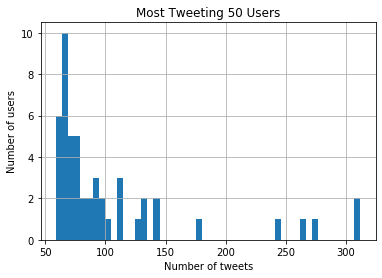

In [90]:
most_tweeting_users.head(50).hist(bins=50) 
plt.title('Most Tweeting 50 Users')
plt.xlabel('Number of tweets')
plt.ylabel('Number of users')
plt.show()

In [91]:
#5- Identify duplicate tweets based on the 'text' field.


In [92]:
duplicateRowsDF = df[df['text'].duplicated()]['text']
print(duplicateRowsDF)

12        RT @NYGovCuomo: BREAKING: I am announcing a new directive requiring NY health insurers to waive cost sharing associated with testing for #c…
14        RT @NYGovCuomo: BREAKING: I am announcing a new directive requiring NY health insurers to waive cost sharing associated with testing for #c…
15        RT @NYGovCuomo: BREAKING: I am announcing a new directive requiring NY health insurers to waive cost sharing associated with testing for #c…
18        RT @shobey_edits: sent a mail to marvel ent, regarding dogyul and dongpyo's fm asking about any update in-line with covid-19 and finally go…
19        RT @shobey_edits: sent a mail to marvel ent, regarding dogyul and dongpyo's fm asking about any update in-line with covid-19 and finally go…
                                                                              ...                                                                     
541788    RT @Laurie_Garrett: If the US govt keeps billing Americans $1000s for evacuations an

In [93]:
# 6- Remove duplicate tweets based on the 'text' field. How many tweets do you have now?

In [94]:
df.drop_duplicates(subset=['text'], inplace=False) 

,Unnamed: 0,Unnamed: 0.1,coordinates,country,created_at,device,entity_hashtags,entity_mentions,entity_type,entity_urls,id_str,in_reply_to_user_id,is_retweet,screen_name,text,tweet_location,user_followers,user_following,user_id,user_location
0,34646,34646,NaN,NaN,2020-03-03 02:49:50,Twitter for iPhone,[],[],NaN,['twitter.com/i/web/status/1…'],1234672302903590913,NaN,False,Manny_Alicandro,"Every 3 days? Coronavirus in NY? Workers will disinfect parts of subways, buses every 72 hours as New York reports… https://t.co/sxVkmdTeME",NaN,9125,4872,992623688028774400,NY
1,34647,34647,NaN,NaN,2020-03-03 02:49:50,Twitter for Android,[],['shobey_edits'],NaN,[],1234672302647738370,NaN,True,wodzd,"RT @shobey_edits: sent a mail to marvel ent, regarding dogyul and dongpyo's fm asking about any update in-line with covid-19 and finally go…",NaN,3123,3103,1086492406466277377,𝐗𝐎𝐧𝐞𝐈𝐭
2,34648,34648,NaN,NaN,2020-03-03 02:49:50,Twitter for iPhone,[],['realDonaldTrump'],NaN,['twitter.com/i/web/status/1…'],1234672301888532480,25073877.0,False,mom2speak1,"@realDonaldTrump Wow, a nice incubator for COVID-19! But hey, what do epidemiologists know, right Donny? Make Ameri… https://t.co/FCk8mUHmKe",NaN,313,1149,800391394191810560,United States
3,34649,34649,NaN,NaN,2020-03-03 02:49:50,Twitter Web App,[],['uk_domain_names'],NaN,[],1234672301712347136,NaN,True,lazaroumterror,"RT @uk_domain_names: ""UK and Scottish government modelling shows that the economic and fiscal costs of a Covid-19 epidemic could be on a pa…",NaN,3871,3935,19881915,London
4,34650,34650,NaN,NaN,2020-03-03 02:49:50,Twitter Web App,[],['LanceHoward70'],NaN,[],1234672300584103936,NaN,True,astro_stephen13,"RT @LanceHoward70: This 👇 is the leader of the free world, folks. A man who does not understand that the “flu shot” will not work as a vacc…",NaN,538,367,148663,"Georgia, USA"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
541769,1048551,1050525,NaN,NaN,2020-02-29 17:56:51,Twitter for iPhone,[],[],NaN,[],1233813395008360448,NaN,False,MANLIKEAFRIKA,All These People Choosing To Travel All Around The Place Right Now Need To Stay In Quarantine When The Time Comes 😤😷,NaN,271,262,148903406,NaN
541777,1048559,1050533,NaN,NaN,2020-02-29 17:56:44,Twitter for Android,[],[],NaN,['rawstory.com/2020/02/quaran…'],1233813365455192064,NaN,False,timmins316,Quarantine patient assures Fox News coronavirus isn’t ‘scary’ because he has no symptoms https://t.co/MtdTjlReX7,NaN,2069,5001,27076961,"Kingston, Ontario"
541778,1048560,1050534,NaN,NaN,2020-02-29 17:56:43,Twitter Web App,[],[],NaN,['twitter.com/i/web/status/1…'],1233813362586398729,NaN,False,the_stormclam,"America had better figure out the answer to ""who pays for the expenses of forced quarantine"" on a national scale an… https://t.co/610bE2e4Ny",NaN,138,518,895746394585157632,NaN
541785,1048567,1050541,NaN,NaN,2020-02-29 17:56:34,Twitter Web App,[],"['DirtyCopHunter', 'tedlieu', 'realDonaldTrump']",NaN,['twitter.com/i/web/status/1…'],1233813323579301888,120978797.0,False,zingertat,"@DirtyCopHunter @tedlieu @realDonaldTrump if it is just the flu, why do countries feel the need to quarantine a who… https://t.co/nvyf9DoJ6t",NaN,31,44,1191480824748752897,NaN


In [95]:
# 7- Replace all users names with the usrusr token. 
#You need to write a regular expression that identify user names and use the replace methodto replace it with the 'usrusr' token.

In [96]:
usernames = df['text'].str.findall(r'@([\w]+)')
for item in usernames:
    for element in item:
        print(element)
        
        
df['text'] = df['text'].replace(to_replace='@([\w]+)', value='usrusr', regex=True)


shobey_edits
realDonaldTrump
uk_domain_names
LanceHoward70
AlArabiya_Eng
HeshmatAlavi
NYGovCuomo
scottburke777
StephenSpeaksUp
POTUS
modooborahae
BTS_twt
mitchellvii
NYGovCuomo
joshtpm
NYGovCuomo
NYGovCuomo
ABCNews
inkmavenart
shobey_edits
shobey_edits
modooborahae
BTS_twt
ChannelNewsAsia
modooborahae
BTS_twt
chrislhayes
shobey_edits
NYGovCuomo
modooborahae
BTS_twt
modooborahae
BTS_twt
gtconway3d
shobey_edits
MariBrighe
catcontentonly
joshtpm
catcontentonly
jenchristiehr
PHLCityHomeless
NYGovCuomo
theedgemalaysia
bar_heejin
NoGunsInCanada
janismullan
CTVNews
shobey_edits
StephenSpeaksUp
POTUS
sazzygram3
XHNews
PamDamoff
kurteichenwald
mojos55
MariBrighe
neomucolorful
Laurie_Garrett
ChannelNewsAsia
modooborahae
BTS_twt
MiamiMayor
CityofMiami
NYGovCuomo
WhiteHouse
realDonaldTrump
NYGovCuomo
modooborahae
BTS_twt
minakimes
shobey_edits
staronline
RealMJMcDonough
44mmvvpp
Jk67Joan
EmeraldRobinson
catcontentonly
AshHurley2
BearPenguin0408
bopinion
FreyjaErlings
MackayIM
wannadoit3
mitchellvi

In [97]:
#8- Replace all URLs with 'urlurl' token in the 'text' column.

In [98]:
#urls = df['text'].str.findall(r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+')
#print(urls)

df['text'] = df['text'].replace(to_replace='http[^\]*', value='urlurl', regex=True)

error: unterminated character set at position 4

In [ ]:
#9- If a tweet starts with "RT @", it is a retweet. Remove all retweets from the dataframe.

In [99]:
df2 = df[~df.text.str.startswith('RT @')]
df = df2


In [ ]:
# 10- If the field is_retweet contains the value True, this tweet is a retweet as well. Remove those as well.

In [101]:
retweets = df['is_retweet'] == True
#df.drop(labels=retweets, inplace = False)
df_without_retweets = df[~df.is_retweet == True]


In [ ]:
# 11- Check how many duplicate tweets are there. Remove them. How many tweets do you have now?

In [100]:
duplicateRowsDF = df.duplicated()
df.drop_duplicates(subset=['is_retweet'], inplace=False) 

,Unnamed: 0,Unnamed: 0.1,coordinates,country,created_at,device,entity_hashtags,entity_mentions,entity_type,entity_urls,id_str,in_reply_to_user_id,is_retweet,screen_name,text,tweet_location,user_followers,user_following,user_id,user_location
0,34646,34646,NaN,NaN,2020-03-03 02:49:50,Twitter for iPhone,[],[],NaN,['twitter.com/i/web/status/1…'],1234672302903590913,NaN,False,Manny_Alicandro,"Every 3 days? Coronavirus in NY? Workers will disinfect parts of subways, buses every 72 hours as New York reports… https://t.co/sxVkmdTeME",NaN,9125,4872,992623688028774400,NY
94612,240473,241061,NaN,NaN,2020-02-29 11:07:38,Twitter Web App,[],[],NaN,['Learn more'],1233710413591785472,NaN,True,SuperliminalS,@SuperliminalS's account is temporarily unavailable because it violates the Twitter Media Policy. Learn more.,NaN,660,1695,1056636821017366529,NaN


In [ ]:
# 12- Plot a histogram of the text lengths. What is the length of the longest and the shortest tweets?

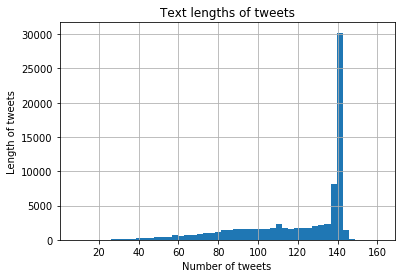

In [103]:
length_of_tweets = df['text'].str.len()
length_of_tweets.hist(bins=50) 
plt.title('Text lengths of tweets')
plt.xlabel('Number of tweets')
plt.ylabel('Length of tweets')
plt.show()

In [ ]:
# 13- Calculate the average tweet length based on the 'text' field.

In [104]:
length_of_tweets.mean()

120.05209947513121

In [ ]:
#14- Extract all words from the 'text' field and put them in a new column. 
#The findall method and a regular expression to recognize words will help you.


In [105]:
words_of_tweets = df['text'].str.findall(r'\w+')
#words_of_tweets = re.findall(r'\w+', df['text'].lower())
df['Words'] = words_of_tweets
print(df['Words'])

0            [Every, 3, days, Coronavirus, in, NY, Workers, will, disinfect, parts, of, subways, buses, every, 72, hours, as, New, York, reports, https, t, co, sxVkmdTeME]
2                [realDonaldTrump, Wow, a, nice, incubator, for, COVID, 19, But, hey, what, do, epidemiologists, know, right, Donny, Make, Ameri, https, t, co, FCk8mUHmKe]
16                                   [Queensland, to, triple, hospital, emergency, department, capacity, amid, coronavirus, spread, https, t, co, ZzFO7lJwo5, via, ABCNews]
24                                          [Wimbledon, school, closes, as, inadequate, govt, response, to, COVID, 19, continues, The, SKWAWKBOX, https, t, co, cWXVanJPSQ]
25             [BREAKING, NEWS, CDC, WILL, NO, LONGER, REPORT, HOW, MANY, PEOPLE, HAVE, BEEN, TESTED, FOR, COVIDー19, The, coverup, up, continues, https, t, co, pCMStZiq5q]
                                                                                        ...                                                 

In [ ]:
#15- Identify the words that occur the most. The Counter object from collections will help you.


In [106]:
# empty Counter
word_counter = Counter()
#df['text'].str.findall(r'\w+')

for tokenlist in df['text'].str.lower().str.findall(r'\w+'):
    word_counter.update(tokenlist)
#print(word_counter.most_common()[:200])
print(word_counter.most_common())

[('t', 83233), ('co', 76809), ('https', 76437), ('the', 50272), ('coronavirus', 45186), ('to', 30409), ('of', 23995), ('in', 22041), ('a', 20124), ('and', 17267), ('is', 17229), ('for', 12503), ('s', 12211), ('i', 10895), ('it', 9220), ('on', 9196), ('you', 8497), ('that', 8119), ('this', 7902), ('outbreak', 7836), ('are', 7701), ('quarantine', 7483), ('from', 7335), ('covid', 7016), ('19', 6894), ('with', 6836), ('as', 5833), ('have', 5823), ('be', 5735), ('not', 5711), ('cases', 5103), ('has', 5065), ('we', 5018), ('people', 4746), ('about', 4600), ('new', 4446), ('trump', 4437), ('if', 4395), ('2019', 4242), ('china', 4109), ('at', 4091), ('they', 3976), ('who', 3660), ('will', 3658), ('how', 3645), ('by', 3639), ('all', 3613), ('cdc', 3586), ('virus', 3556), ('via', 3534), ('what', 3510), ('but', 3490), ('us', 3363), ('can', 3293), ('just', 2997), ('was', 2963), ('more', 2961), ('there', 2944), ('health', 2929), ('no', 2897), ('ncov', 2869), ('so', 2820), ('he', 2794), ('covid19', 

In [ ]:
# 16- How many of the words occur only once? List 100 of them. Provide tweets that contain these words.

In [107]:
occur_once_keys = []
for key, value in word_counter.items():
    if value == 1:
        occur_once_keys.append(key)
        
for item in occur_once_keys[:100]:
    print(item)

sxvkmdteme
fck8muhmke
zzfo7ljwo5
cwxvanjpsq
pcmstziq5q
rgoesi0gxa
demog
instd
ksnz7j8a8j
zahehiobd8
mssusangb
bcqroqxasn
jcrvrimnif
8ykvk9hmj0
tk8dpolole
da10ayerxi
ox3kxg7c2o
k1adpbl1mt
tjk827
ys23ek7vch
msbiederman
usalovegod
yy5cvyad99
saar1980
monique11344899
kanyewest
frkn3honzj
l4snxiau4o
wadkvs8vyr
jotykay
melaninjunkee
somerdis1
dimplessimples
tudzaa
shoujkuffc
alenesmiles
londongal_28
kristyshl
hollyhuntley3
zkfcvxh25v
dismissive
overrea
duz09c1epk
bqsp5hyyns
fluvax
2l0gpida3w
xhst5apqdn
y9oskdtlkk
vinayak_jain
perryjo52824801
carcosav
tispurtunurs
r2vv1ts1gw
emlpoyees
5yrbyfdqez
pums
ufsj0va7me
wooouzsvxv
s4gbwfylau
gkmhmtnjr7
v8zrr94g1p
kneupper
gwinstonpiano
c1f7ur7o0n
7bmsx3aelp
aiciawrxgq
4etbmhs9b9
greyseeker
cof
z8kewm2e35
dogyul
dongpyo
dc0w0qld6v
bkwmoggawt
thebeatwithari
3orlkouqtn
egiuiyu6zm
27zz5bghqj
zxkczojj2f
communicates
p1ubug776r
the_pdac
invest_canada
mary_ng
seamusoregan
whayevs
rep7lnh8gd
chk0eh2gyq
globalvillage
4lqruhudqu
p0kyfiex0p
qkshhlxzhk
j3knuc8fta

In [ ]:
#17- Find the longest 100 words. List them.

In [108]:
new_word_counter = {}
for k in sorted(word_counter, key=len, reverse=True): # Through keys sorted by length
    new_word_counter[k] = word_counter[k]
keys = list(new_word_counter.keys())
for key in keys[0:100]:
    print(key)

governmentsof_japan_italy_iran_irak_palestina_cisjordnia
bahabdhsisjdhdhdhshsudhehsushahahahahhahahahahahaha
itbcancellationcouldhurtbalearicbusinesses
commongoldendemocraticequalityregionin
sleepingonthecouchoutsideherbedroom
tacklingnationalsecuritychallenges
wuhan_coronavirus_survival_manual
22dba8c1e94654caab56b9bb483f7e4a
cc397384a5b258bab403594f4edbb73b
50a0f72b87265844b9b0badc718ef634
917c20aaf12d51beb966474940ac560b
30f33416763b5208957a2d4161c23a45
strategicwaterinfrastructurelab
paracetamoxyfrusebendroneomycin
masksareuselessonhealthypeople
thefalconandthewintersoldier
veteransagainstvotingstupid
coronavirusexpediadonotcare
economicconditionsandtrends
worldwidebrandadvertisement
wasreallylookingforwardtoit
beingsocheerfulkeepsusgoing
coronavirus_mask_protection
2020_21_northern_hemisphere
selfloathingclosetcasepence
covid19hospitalpreparedness
trumpownsthemarketmeltdown
whoworldhealthorganization
minaminagasakisportscenter
renewablepowersystemsdelhi
kunmingplateauhalfmarathon


In [ ]:
#18- Find tweets that are all in upper case, such as "THIS IS A TWEET ALL UPPER CASE." in their 'text' field. 

In [ ]:
#df['text'].str.isupper()

i = 0
for i in df['text'][i]:
    i +=1
    if df['text'][i].str.isupper() == True:
        print(df['text'][i])

In [ ]:
#19- Identify the mostly occurring 50 hashtags.

In [109]:
word_counter2 = Counter()
for tokenlist in df['text'].str.lower().str.findall(r"#(\w+)"):
    word_counter2.update(tokenlist)
print(word_counter2.most_common()[:50])

[('coronavirus', 8583), ('covid19', 2501), ('covid2019', 628), ('coronavirusoutbreak', 373), ('iran', 346), ('covid', 329), ('china', 315), ('covidー19', 259), ('covid_19', 210), ('coronavirusupdates', 199), ('news', 195), ('sarscov2', 187), ('hoax', 182), ('trump', 174), ('cdc', 161), ('coronavid19', 143), ('coronavirusupdate', 138), ('rt', 127), ('breaking', 121), ('corona', 120), ('covad19', 119), ('wuhan', 114), ('2019_ncov', 107), ('quarantine', 104), ('smartnews', 103), ('who', 94), ('foxnews', 94), ('googlealerts', 93), ('covid19nigeria', 90), ('italy', 87), ('covid19us', 86), ('coronavirusus', 80), ('southkorea', 75), ('us', 72), ('ncov_2019', 70), ('outbreak', 69), ('health', 67), ('pandemic', 67), ('2019ncov', 66), ('japan', 65), ('wuhancoronavirus', 63), ('virus', 61), ('chinavirus', 58), ('coronaviruske', 57), ('trumpliesaboutcoronavirus', 57), ('cdclies', 55), ('usa', 54), ('coronavirusuk', 50), ('bitcoin', 47), ('travel', 46)]


In [ ]:
#20- Export the final dataframe to csv and Excel files.

In [114]:
df.to_csv(r'/Volumes/Archive/final\ assignment \finalassignment.csv', index = False)
df.to_excel(r'/Volumes/Archive/final\ assignment \finalassignment.xlsx', index = False)

In [ ]:
### Find tweets about Trump (not including retweets). Print 100 of them.

In [112]:
tweets_trump =[]

for item in df['text']:
    if 'RT' not in item:
        if 'Trump' in item:
            tweets_trump.append(item)
for item in tweets_trump[:100]:
    print(item)
    

@realDonaldTrump Wow, a nice incubator for COVID-19! But hey, what do epidemiologists know, right Donny? Make Ameri… https://t.co/FCk8mUHmKe
@DrNikkiMartinez Point well taken. I read that Trump is trying to get health officials to say we will have a  Covid… https://t.co/zXkcZojJ2F
I hope he’s right about Trump but wrong about Covid-19.  Stocks will plunge, Trump will lose the election, and the… https://t.co/OpyIHBiNoo
POTUS redrawing COVID-19 with a sharpie on a page he tore out of his daily intel briefing #TrumpVirus https://t.co/OAkec2LsJ2
After asking if the flue vaccine could work on COVID-19...  Trump Tells Drug Companies ‘Get It Done’ on Virus Treat… https://t.co/EntO7GA61I
Karel Cast Feb 28 Covid 19 Invented By Democrats To Kill Americans and Defeat Trump https://t.co/lAaP69qZ2S
@jeannefisher17 @realDonaldTrump Since the Louvre doesn't peddle Big Macs, I don't think he's heard of it.  But as… https://t.co/0VXzK8ueA2
IMHO, if Trump continues to mismanage and jawbone the COVID-19 

In [ ]:
### Find tweets about Turkey (not including retweets). Print 100 of them.

In [113]:
tweets_turkey =[]

for item in df['text'].str.lower():
    if 'RT' not in item:
        if 'turkey' in item:
            tweets_turkey.append(item)
for item in tweets_turkey[:100]:
    print(item)

@ohiothrowaway @turkeymedia @petrakle @florian_krammer https://t.co/wjzlpaujea (very slow site)  and many articles… https://t.co/cuflcucayi
@sabrina_mcda @mjcrjdrvrsoonrf so he can't handle the dem "establishment" but he can handle russia?  nk?  turkey?… https://t.co/djoy0bjpqt
if they are healthy then why not stay in turkey? why must europe take them.      #breakingnews #coronavirusoutbreak… https://t.co/lrogpg2ang
@johnspringford which of today's stories merited "blimey"? coronavirus? floods? possible war between turkey &amp; russi… https://t.co/qkhp8okhcu
bruh how come turkey is one of the safest places i don't understand jshshsjs maybe it's bc we're paranoid so everyo… https://t.co/lpkmvkkq93
amidst the coronavirus scare and terrible news from turkey, just wrapped up an exciting workshop in vienna. 40-some… https://t.co/8w6ounrjmb
@selingirit #refugees #turkey well judging from the videos #coronavirus will have a field day in spreading with so… https://t.co/noiotlzscb
well yeah it 